# Глубинное обучение, LGJ ВШЭ

## Домашнее задание 2 (сложное). Детекция объектов.

### Общая информация

### Оценивание и штрафы

Максимально допустимая оценка за работу без бонусов — 10 баллов. Сдавать задание после указанного срока жесткого дедлайна нельзя.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов. Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке. Также оценка может быть снижена за плохо читаемый код и плохо оформленные графики. Все ответы должны сопровождаться кодом или комментариями о том, как они были получены.

Использование генеративных моделей допустимо на следующих условиях:
- Количество кода, написанное генеративными моделями, не превышает 30%
- Указана модель, использованная для генерации, а также промпт
- В конце работы необходимо описать свой опыт использования генеративного ИИ для решения данного домашнего задания. Укажите как часто Вам приходилось исправлять код своими руками или просить модель что-то исправить. Было ли это быстрее, чем написать код самим?

В случае невыполнения этих требований работа не оценивается и оценка за неё не превышает 0 баллов.

### О задании

Сыграем в квиддич? Или лучше в карты?

В этом дз вам предстоит написать практически с нуля архитектуру для детекции, а также воспользоваться готовым решением. На выбор даётся два датасета, отличаются они только картинками. Форматы, баллы - все одинаково.

Первый вариант это датасет по кадрам игры в квиддич из Гарри Поттера. Если вы забыли правила, то нажмите [сюда](https://harrypotter.fandom.com/ru/wiki/%D0%9A%D0%B2%D0%B8%D0%B4%D0%B4%D0%B8%D1%87). Вы научитесь искать и выделять на фотографиях бладжеры, квоффл и снитч.

Второй вариант это датасет с игральными картами. Если вы забыли что такое карты, то нажмите [сюда](https://ru.wikipedia.org/wiki/%D0%98%D0%B3%D1%80%D0%B0%D0%BB%D1%8C%D0%BD%D1%8B%D0%B5_%D0%BA%D0%B0%D1%80%D1%82%D1%8B). Вы научитесь искать и выделять на фотографиях несколько типов карт.

Оба варианта содержат около 300 картинок, данные хранятся в xml в формате PascalVOC. Есть малые отличия, но ничего страшного.


Если с самописным детектором совсем не получается, то можно после создания датасетов перейти к концу, где обучается готовый, с ним будет проще :)

### Консультация 2023 года

https://www.youtube.com/watch?v=oCwEmKW3bYg

# Notes

Дз проверялось на работоспособность в colab. Не гарантируется, что будет работать на чем-то другом. На Windows, скорее всего, вас ждет немало проблем :(

По вопросам формулировок (не ошибок торча!), в случае отсутствия ответа в общем чате (поиск по чату позволяет проверить), можно написать в него с тегом @markblumenau.

In [ ]:
%pip list | grep torch

torch                                 2.6.0+cu124
torchao                               0.10.0
torchaudio                            2.6.0+cu124
torchdata                             0.11.0
torchsummary                          1.5.1
torchtune                             0.6.1
torchvision                           0.21.0+cu124


In [ ]:
!nvidia-smi

Sun Jul 13 17:14:12 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   64C    P8             11W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## Данные

Скачайте один из датасетов на свой вкус и начните работу с ним.
Разметка находится в xmls папке, картинки в images.

In [ ]:
# Harry Potter -- uncomment
!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip

# Cards -- uncomment
#!wget https://github.com/markblumenau/hw3_iad_dl/raw/main/cards/data.zip

!unzip -q data.zip

--2025-07-13 17:14:12--  https://github.com/markblumenau/hw3_iad_dl/raw/main/harry/data.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip [following]
--2025-07-13 17:14:12--  https://raw.githubusercontent.com/markblumenau/hw3_iad_dl/main/harry/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 17592727 (17M) [application/zip]
Saving to: ‘data.zip.2’

data.zip.2          100%[===================>]  16.78M  --.-KB/s    in 0.1s    

2025-07-13 17:14:12 (154 MB/s) - ‘data.zip.2’ saved [17592727/17592727]

replace data/class_dict? [y]es, [n]o, [A]ll

In [ ]:
# %pip install ultralytics xmltodict

In [ ]:
import glob
import shutil

from pathlib import Path
from typing import List

import xmltodict
import albumentations as A
import matplotlib.pyplot as plt
import numpy as np
import torch
import torchvision
import ultralytics
import torch.nn.functional as F

from albumentations.pytorch.transforms import ToTensorV2
from matplotlib.patches import Rectangle
from PIL import Image
from torch import nn
from torchvision.models import ResNet50_Weights
from tqdm.notebook import tqdm
from ultralytics import YOLO

In [ ]:
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"Device count: {torch.cuda.device_count()}")
print(f"Current device: {torch.cuda.current_device()}")

CUDA available: True
Device count: 1
Current device: 0


# Задача 1. 0.5 балла.

Ниже написан код для стандартного Dataset из библиотеки pytorch. Dataset требует реализации `__getitem__` и `__len__` методов. Далее эти методы будут использованы для формирования батчей для обучения. Поскольку читать придется из xml файлов, нужно перед этим дописать функцию get_xml_data, чтобы по названию картинки подтягивать аннотации.

Функции можно и нужно передать некий class_dict. Он есть и при инициализации датасета ниже. С его помощью можно название класса превратить в int. Далее подразумевается, что класс идёт как int.

In [ ]:
BALL_MAPPING = ["bludger", "quaffle", "snitch"]

In [ ]:
def get_xml_data(image_name, root, class_dict, xml_prefix="/xmls/"):
    # get smth like ZZZ/YYY/XXXXXX.jpg -> XXXXXX
    # Ваш вариант неудобный, извиняюсь. Переписал, используя xmltodict
    filename = image_name.split("/")[-1].split(".")[0]
    xml_name = str(root) + xml_prefix + filename + ".xml"
    with open(xml_name, 'r', encoding='utf-8') as file:
        xml_data = file.read()
        data_dict = xmltodict.parse(xml_data)

    bboxes = []

    data = data_dict['annotation']['object']

    if isinstance(data, dict):
        data = (data, )

    for member in data:
        # you need: xmin ymin xmax ymax, class in dict
        # то есть res выглядит как [xmin, ymin, xmax, ymax, class]
        # всё в int!
        # Для корректной работы клеточек ниже требуется конкретная последовательность координат
        # См. доку https://albumentations.ai/docs/getting_started/bounding_boxes_augmentation/
        # Нас интересует pascal_voc формат, далее применяется он.
        res = [
            int(member['bndbox'][x]) for x in ["xmin", "ymin", "xmax", "ymax"]
        ] + [BALL_MAPPING.index(member['name'])]
        bboxes.append(res)

    return bboxes

In [ ]:
class PascalDataset(torch.utils.data.Dataset):

    def __init__(self, *, transform, root="dataset", train=True, seed=42):
        self.root = Path(root)
        self.transform = transform

        assert self.root.is_dir(), f"No data at `{root}`"

        self.filenames = np.array(glob.glob(root + "/images/*"))
        with open(str(self.root) + "/class_dict", "r") as f:
            self.class_dict = eval(f.readline())

        self.class_dict_inv = {v: k for k, v in self.class_dict.items()}

        np.random.seed(seed)
        permutation = np.random.permutation(len(self.filenames))

        # Train/test split
        if train:
            self.filenames = self.filenames[
                permutation[: int(len(self.filenames) * 0.9)]
            ].tolist()
        else:
            self.filenames = self.filenames[
                permutation[int(len(self.filenames) * 0.9) :]
            ].tolist()

    def __getitem__(self, idx):
        # Нужно обладая файлнеймом подгрузить картинку и бибоксы, функцию для подгрузки бибоксов вы дописали выше :)
        fname = self.filenames[idx]
        image = np.array(Image.open(fname))
        bboxes = get_xml_data(
            image_name=fname, root=self.root, class_dict=self.class_dict
        )

        # transform будут объявлены ниже за вас
        # Но библиотека привередлива к формату данных на входе, внимательно прочтите прошлую клеточку
        return self.transform(image=image, bboxes=bboxes)

    def __get_raw_item__(self, idx):
        fname = self.filenames[idx]
        return fname, get_xml_data(fname, self.root, self.class_dict)

    def __len__(self):
        ### YOUR CODE HERE ###
        return len(self.filenames)

Ниже определяем стандартные нормализации и приведение размера к 512x512.


In [ ]:
%pip list | grep albumentations

albumentations                        2.0.8


Поменял Normalize ниже, он был написан для более старой версии albumentations и ломался

In [ ]:
mean = (0.485, 0.456, 0.406)
std = (0.229, 0.224, 0.225)

train_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    # Вот тут мы говорим что хотим pascal_voc
    bbox_params=dict(format="pascal_voc", min_visibility=0.3),
)

test_transform = A.Compose(
    [
        A.Resize(512, 512),
        A.Normalize(mean=mean, std=std),
        ToTensorV2(),
    ],
    bbox_params=dict(format="pascal_voc", min_visibility=0.5),
)

In [ ]:
train_ds = PascalDataset(root="./data/", transform=train_transform, train=True)
test_ds = PascalDataset(root="./data/", transform=test_transform, train=False)

# Задача 2. 1 балл.

Теперь, когда мы загрузили данные, хорошо бы посмотреть на них, прежде чем обучать какие-либо модели. Напишите функцию `visualize`, которая принимает списки изображений и прямоугольников в качестве входных данных и рисует эти прямоугольники на изображениях.

В датасете есть class_dict_inv, который позволит вам сделать обратное преобразование: int, содержащий класс, в строку с названием.


Полезные функции:
* [plt.subplots](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html) -- легко создавать несколько изображений в одной pyplot figure
* [ax.imshow](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.imshow.html) -- отображение графиков (не забудьте откатить нормализацию)
* [ax.text](https://matplotlib.org/stable/api/_as_gen/matplotlib.axes.Axes.text.html), [patches.Rectangle](https://matplotlib.org/stable/api/_as_gen/matplotlib.patches.Rectangle.html) -- для рисования прямоугольников и текста с аннотацией

In [ ]:
def visualize(images, bboxes):
    mean = (0.485, 0.456, 0.406)
    std = (0.229, 0.224, 0.225)

    fig, axes = plt.subplots(
        2, len(images) // 2 + len(images) % 2, figsize=(10, 8), dpi=100
    )

    for i, ax in enumerate(axes.reshape(-1)):

        ax.axis(False)

        if i >= len(images):
            break
        # Вот тут нужно выполнить permute (вспомните где у torch каналы, а где они у matplotlib)
        # И откатить нормализацию (просто обратное преобразование)
        # Имена и количества классов можно подтянуть из датасета через train_ds.class_dict_inv

        denormalized_image = (images[i] * torch.tensor(std)[:, None, None]) + torch.tensor(mean)[:, None, None]
        denormalized_image_np = denormalized_image.permute(1, 2, 0).cpu().numpy()
        ax.imshow(denormalized_image_np)

        for bbox in bboxes[i]:
          # Вот тут нарисуйте бибоксы
          rect = Rectangle(
              (bbox[0], bbox[1]),
              bbox[2] - bbox[0],
              bbox[3] - bbox[1],
              linewidth=1,
              edgecolor="r",
              facecolor="none"
          )
          ax.add_patch(rect)
          name = BALL_MAPPING[int(bbox[-1])]
          ax.annotate(
              name, (1.1, 0.5), xycoords=rect, annotation_clip=True, color="red"
          )

    fig.tight_layout()
    plt.show()

У вас должно получиться что-то похожее на изображения для датасета с масками:

![image](https://i.imgur.com/V5TUT26.png)

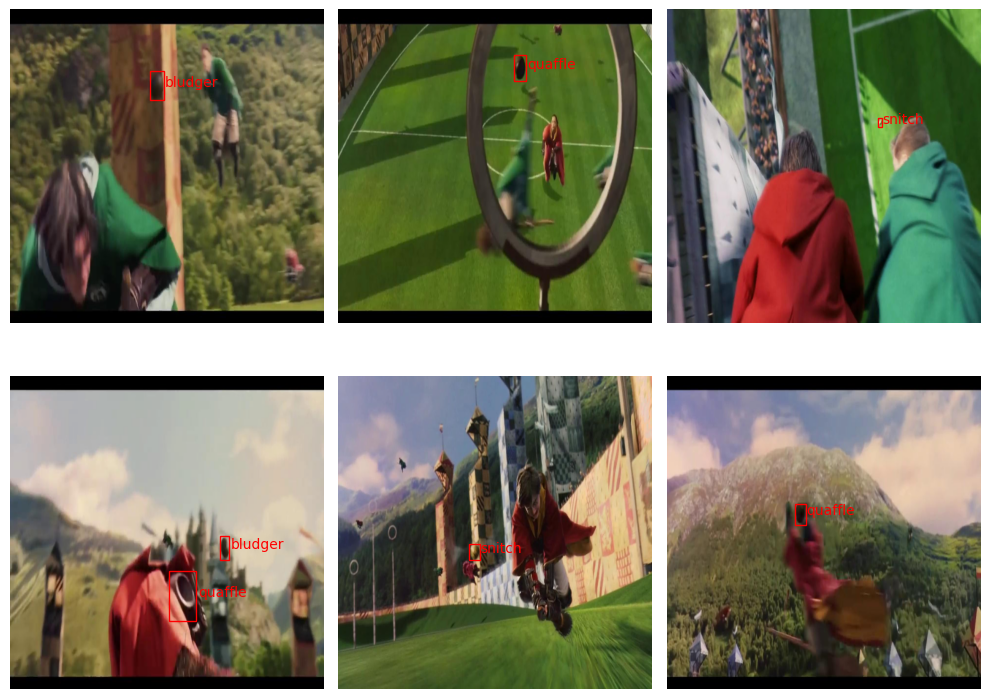

In [ ]:
out = [train_ds[i] for i in range(6)]
visualize([o["image"] for o in out], [o["bboxes"] for o in out])

# Задача 3. 3 балла.
## YOLO-like детектор

Сейчас нам предстоить реализовать детектор, похожий на YOLO. Это один из самых простых детекторов с точки зрения реализации. YOLO описан в статье: [You Only Look Once: Unified, Real-Time Object Detection](https://arxiv.org/abs/1506.02640). Здесь мы его немного изменим и упростим. Будем использовать ResNet для извлечения признаков. На выходе мы будем получать карту признаков размера 16x16.

## Задача 3.1. 1 балл.

Первым делом нам нужно реализовать collate function. Это функция позволит нам кастомизировать, как именно батч конструируется из примеров (смотрите [pytorch docs](https://pytorch.org/docs/stable/data.html#dataloader-collate-fn) для деталей).

Это функция должна принять на вход лист прямоугольников и вернуть тензор размера Bx6x16x16. Первая размерность - это количество примеров в батче. Вторая -- "каналы", суть которых написана чуть ниже. Далее идут две пространственные размерности, это сетка 16 на 16. Зафиксируем порядок координат как (y, x) для этой сетки 16 на 16. Это значит, что в target идут ```cy_idx, cx_idx``` в таком порядке, см. код.

В шести "каналах" у нас будут записаны:
* Сдвиги центра bbox относительно начала клеточки (клеточка это "гиперпиксель" на изображении 16 на 16 на выходе сети). Записаны эти сдвиги будут в клеточку, к которой относятся. 2 канала (X, Y)
* Нормализованные ширина и высота bbox. 2 канала (W, H)
* Confidence сетки. Им мы будем пользоваться, чтобы фильтровать уверенность сетки в наличии bbox в данной клетке. Таргет содержит 1 там, где bbox есть, и 0 иначе. 1 канал
* Класс детекции (тот самый int, полученный из строки с названием)

### Пояснительная картинка.

Она обладает некоторым уровнем абстракции, чёрных например должно быть 512, а зелёная должна захватывать 32 маленькие черные. Но может будет понятнее :)

![image](https://i.imgur.com/13YVxAd.jpeg)

In [ ]:
def collate_fn(batch, downsample=32):

    imgs, batch_boxes = map(list, (zip(*[(b["image"], b["bboxes"]) for b in batch])))

    imgs = torch.stack(imgs)
    b, _, h, w = imgs.shape

    target = imgs.new_zeros(b, 6, h // downsample, w // downsample)

    # Add sample index to targets
    for i, boxes in enumerate(batch_boxes):

        xmin, ymin, xmax, ymax, classes = map(
            torch.squeeze, torch.split(imgs.new_tensor(boxes), 1, dim=-1)
        )

        # Нормализуйте ширину и высоту, поделив на ширину и высоту исходного изображения
        x_cell = w // downsample # размер клетки по X в пикс
        y_cell = h // downsample # размер клетки по Y в пикс

        # ширина и высота бибокса могут превышать размеры гиперпикселя
        # поэтому их мы нормируем на полноценные 512
        w_box = (xmax - xmin) / w # ширина бокса отнормированная на размер изначальной картинки
        h_box = (ymax - ymin) / h # высота бокса отнормированная на размер изначальной картинки

        # Посчитайте координаты центра и сдвиги
        cx = xmin + (xmax - xmin) / 2 # координаты центра в исходных координатах
        cy = ymin + (ymax - ymin) / 2 # координаты центра в исходных координатах

        # Посчитайте индекс центра на карте признаков размера 16x16.
        # Это будут как раз координаты пикселя, куда мы запишем параметры коробки)
        cx_idx = (cx / downsample).int()
        cy_idx = (cy / downsample).int()

        # Посчитайте сдивиги относительно cx_idx
        cx_box = cx / downsample - cx_idx
        cy_box = cy / downsample - cy_idx

        # cy_idx, потом cx_idx
        target[i, :, cy_idx, cx_idx] = torch.stack(
            [cx_box, cy_box, w_box, h_box, torch.ones_like(cx_box), classes]
        )

    return {"image": imgs, "target": target}

Следующей функцией Вы можете проверить свою реализацию. Проверка не является блокирующей.

In [ ]:
def test_collate_fn() -> None:
    target1 = [100, 200, 200, 300, 2]  # xmin, ymin, xmax, ymax, class
    target2_1 = [0, 250, 200, 300, 0]  # xmin, ymin, xmax, ymax, class
    target2_2 = [0, 100, 100, 300, 1]  # xmin, ymin, xmax, ymax, class

    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": [target1]},
            {"image": torch.rand((3, 512, 512)), "bboxes": [target2_1, target2_2]},
        ]
    )

    # Проверяем размерности
    assert result["image"].shape == (2, 3, 512, 512)
    assert result["target"].shape == (2, 6, 16, 16)

    # Проверяем значения клеточек, в которые попали ббоксы
    assert np.allclose(
        result["target"][0, :, 7, 4],
        torch.tensor([22 / 32, 26 / 32, 100 / 512, 100 / 512, 1, 2]),
    ), result["target"][0, :, 7, 4]
    assert np.allclose(
        result["target"][1, :, 8, 3],
        torch.tensor([4 / 32, 19 / 32, 200 / 512, 50 / 512, 1, 0]),
    ), result["target"][1, :, 8, 3]
    assert np.allclose(
        result["target"][1, :, 6, 1],
        torch.tensor([18 / 32, 8 / 32, 100 / 512, 200 / 512, 1, 1]),
    ), result["target"][1, :, 6, 1]

    # Проверяем, что все остальные клеточки содержат нули
    result["target"][0, :, 7, 4] = result["target"][1, :, 8, 3] = result["target"][
        1, :, 6, 1
    ] = torch.zeros(6)
    assert np.allclose(result["target"], 0)
    print("All tests passed!")


test_collate_fn()

All tests passed!


Ниже вы можете увидеть пример, как выглядит решетка размера 16 на 16 на исходном изображении:

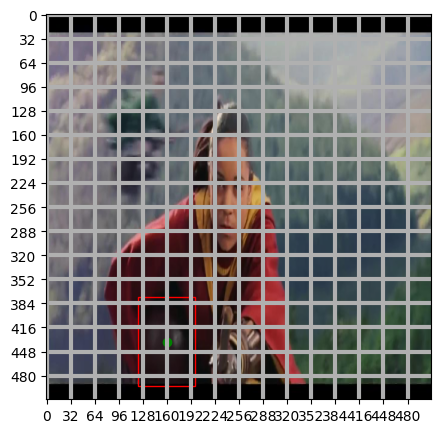

In [ ]:
fig, ax = plt.subplots(figsize=(5, 5))
i = 20

img = train_ds[i]["image"].permute(1, 2, 0) * torch.tensor(std).view(
    1, 1, -1
) + torch.tensor(mean).view(1, 1, -1)
bboxes = torch.tensor(train_ds[i]["bboxes"])

ax.imshow(img)
loc = plt.matplotlib.ticker.MultipleLocator(base=32)
ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)
ax.grid(which="major", axis="both", linestyle="-", linewidth=3)

for bbox in bboxes:
    xmin, ymin, xmax, ymax = bbox[:-1]
    w = xmax - xmin
    h = ymax - ymin
    with_mask = bbox[-1]
    ax.add_patch(Rectangle((xmin, ymin), w, h, fill=False, color="red"))

cx = (bboxes[:, 0] + bboxes[:, 2]) / 2
cy = (bboxes[:, 1] + bboxes[:, 3]) / 2

ax.scatter(cx, cy, color="green", marker="o")

plt.show()

## Задача 3.2. 0.5 балла.

Выход нашей сетки будет несколько больше, чем Bx6x16x16. Почему?

Мы решаем задачу, где классов больше одного. Вспомним прошлое дз: target был одним числом, но выход сетки содержал длинный-длинный вектор, из которого мы получали вероятность принадлежности к тому или иному классу. Здесь то же самое, но как бы в двумерии: у каждой клеточки из этих 16*16 будет свой вектор длины C, который мы будем использовать для определения класса.

Реализуйте обратное относительно collate_fn преобразования, чтобы декодировать выход нейронной сети. Применив функцию decode_prediction к выходу collate function вы должны получить изначальный набор прямоугольников с корректными размерами и координатами, а также классами. Применив к выходу нейросети мы тоже должны получить набор прямоугольников и тоже с корректными классами.

То есть, нужно проделать операции из collate_fn в обратную сторону, но учесть, что у неройнки выход будет чуть длиннее, и там мы должны брать argmax для определения класса.

Hint: в target classes идут в конце. В нейронке они тоже будут в конце, но их будет больше 1. Можно проверять число каналов пришедшего объекта, если оно 6, то перед нами target и надо брать значение, которое записано в клеточке. Иначе (каналов больше 6) перед нами выход нейронки, и надо брать самый вероятный из них.

In [ ]:
# Тут использовался DeepSeek-V3-0324
# Промпт:
# 1. сначала описание 3.1
# 2. потом описание 3.2
# 3. потом просьбa перепроверить
# 4. потом просьбa вернуть формат xmin, ymin, xmax, ymax
# Код уже вставлял в decode_prediction, редактируя под себя и исправляя

def decode_prediction(pred, upsample=32, threshold=0.7) -> List[List[List[float]]]:
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    is_target = (c == 6)
    result = []

    for batch_idx in range(b):
        # result[0] == bboxes on image 0
        # result[0][0] == first bbox on image 0
        # result[0][0] == [xmin, ymin, xmax, ymax, class]
        batch_result = []
        grid_pred = pred[batch_idx, :, :, :]

        conf_mask = grid_pred[4] > threshold
        confident_cells = torch.nonzero(conf_mask)

        for cy_idx, cx_idx in confident_cells:
            cy_idx, cx_idx = cy_idx.item(), cx_idx.item()

            # Decode box coordinates
            offset_x = grid_pred[0, cy_idx, cx_idx].item()
            offset_y = grid_pred[1, cy_idx, cx_idx].item()
            w = grid_pred[2, cy_idx, cx_idx].item() * img_w
            h = grid_pred[3, cy_idx, cx_idx].item() * img_h

            # Convert grid cell + offset to absolute coordinates
            cx = ((cx_idx + offset_x) / 16) * img_w
            cy = ((cy_idx + offset_y) / 16) * img_h

            # x-min, y-min and so on
            xmin = int(max(0, cx - w/2))
            ymin = int(max(0, cy - h/2))
            xmax = int(min(img_w, cx + w/2))
            ymax = int(min(img_h, cy + h/2))

            # Class handling
            if is_target:
                class_idx = grid_pred[5, cy_idx, cx_idx].long().item()
            else:
                class_probs = grid_pred[5:, cy_idx, cx_idx]
                class_idx = torch.argmax(class_probs).item()

            bbox = [xmin, ymin, xmax, ymax, class_idx]
            batch_result.append(bbox)

        result.append(batch_result)

    return result

Следующей функцией Вы можете проверить свою реализацию. Проверка не является блокирующей.

In [ ]:
def test_decode_predictions() -> None:
    # Применяем collate_fn к некоторым данным
    target1 = [[100, 200, 200, 300, 2]]
    target2 = [[0, 250, 200, 300, 0], [0, 100, 100, 300, 1]]
    result = collate_fn(
        [
            {"image": torch.rand((3, 512, 512)), "bboxes": target1},
            {"image": torch.rand((3, 512, 512)), "bboxes": target2},
        ]
    )

    target = result["target"]
    assert target.shape == (2, 6, 16, 16)
    # В таком виде target соответствует поиску одного класса - 6-ой канал.
    # Добавим еще 2 канала, чтобы проверить работу функции для нескольких классов
    target = torch.cat(
        [target, torch.zeros(2, 2, 16, 16)], dim=1
    )  # Добавляем два канала
    assert target.shape == (2, 8, 16, 16)  # Теперь их стало 8

    target[0, 5:, 7, 4] = torch.tensor([0.5, 0.6, 0.9])  # Это должен быть класс 2
    target[1, 5:, 8, 3] = torch.tensor([0.9, 0.6, 0.5])  # Это должен быть класс 0
    target[1, 5:, 6, 1] = torch.tensor([0.6, 0.9, 0.5])  # Это должен быть класс 1

    # Считаем результат
    actual = decode_prediction(target)
    print("Actual:  ", actual)

    # Порядок ббоксов для target2 может меняться в зависимости от вашей реализации и это не ошибка.
    # Скорее всего, он будет такой. Но если ассерт не проходит, попробуйте поменять их местами.
    expected = [target1, [target2[1], target2[0]]]
    # expected_1 = [ target1, [ target2[0], target2[1] ] ] # <-- такой ответ тоже правильный.
    print("Expected:", expected)

    # Сравниваем
    assert actual == expected
    print("All tests passed!")


test_decode_predictions()

Actual:   [[[100, 200, 200, 300, 2]], [[0, 100, 100, 300, 1], [0, 250, 200, 300, 0]]]
Expected: [[[100, 200, 200, 300, 2]], [[0, 100, 100, 300, 1], [0, 250, 200, 300, 0]]]
All tests passed!


## Задача 3.3. 1 балл.
Реализуйте модель. Первым делом примените первые 4 блока (до layer4 включительно, можно при помощи ```list(model.children())[:-2]```) ResNet50. Далее добавьте несколько блоков (Conv2D, BatchNorm2D, ReLU). Постепенно уменьшайте количество каналов до 5+C, а размер изображения до 16 на 16. Например, 2048 -> 512 -> 128 -> 32 -> 5+C, где С - количество классов в вашем датасете. Размер ядра при этом 3, паддинг 1. Но вариантов много, попробуйте разные! **Последним слоем обязательно должна быть свертка.** Так как все значения, которые мы предсказываем, находятся в отрезке от 0 до 1 (благодаря нормировке с клеточками), мы после финальной свертки еще применим сигмоиду. Для классов в такой постановке это не навредит.

Если будете фантазировать, то для получения правильного размера изображения после сети не стесняйтесь применять слои с фильтрами больше 3.

In [ ]:
model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)

In [ ]:
# Количество классов в вашем датасете, хоть руками посчитайте, хоть подтяните из словаря классов
C = len(BALL_MAPPING)

class Detector(nn.Module):
    def __init__(self):
        super().__init__()
        model = torchvision.models.resnet50(weights=ResNet50_Weights.DEFAULT)
        resnet = nn.ModuleList(list(model.children())[:-2])
        self.model = nn.Sequential(
            *resnet,
            nn.Conv2d(in_channels=2048, out_channels=512, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=512, out_channels=128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=128, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(in_channels=32, out_channels=5+C, kernel_size=3, padding=1),
            nn.Sigmoid(),
        )

    def forward(self, img):
        return self.model(img)

## Задача 3.4. 0.5 балла.

Реализуйте функцию потерь.

Для этого:
* Сделайте маску, которая будет говорить о положении детектируемых объектов. Её нужно использовать с помощью masked_select (см. доки PyTorch)
* Лосс похож на оригинальный для Yolo V1 и состоит из 4 частей (reduction='sum' для всех)
    - localization loss - Мы берем MSE по координатам бокса там, где есть детектируемый объект
    - box_loss - MSE от корней ширины и высоты bbox там, где есть детектируемый объект
    - classification_loss - Если детектируемый объект есть, то его кросс-энтропия по его классу
    - confidence_loss - Бинарная кросс-энтропия факта наличия объекта ДЛЯ ВСЕХ пикселей. Делается отдельно для детектируемых объектов (вес 1) и для недетектируемых (вес 0.1 например, поскольку их гораздо больше, но можно экспериментировать)


* Если будете делать описанное выше, то учтите reduction. Бинарная кросс-энтропия вызывается через BCELoss. Параметр C используется для задачи числа классов. Подумайте как зависит индексация от параметра C и используйте его.

In [ ]:
# Тут использовался DeepSeek-V3-0324
# Промпт (в том же чате, что и запрос выше):
# 1. Write loss function for YOLO model
# 2. Can you also use these formulas as reference? + картинка из презентации
# 3. Please double check the function above, optimize it and remove redundant code
# 4. Code returns the following error near target_onehot RuntimeError: The size of tensor a (16)
#    must match the size of tensor b (3) at non-singleton dimension 3

# Переименовал С в num_classes
def special_loss(
    preds: torch.Tensor,
    targets,
    num_classes: int = 3,
    lambda_coord: float = 5.0,
    lambda_noobj: float = 0.5,
    grid_size: int = 16,
    eps: float = 1e-9
) -> float:

    """
    Args:
        pred: Tensor (B, 5 + C, S, S) - network predictions
                Channels: [x, y, w, h, conf, class_probs...]
        targets: Tensor (B, 6, S, S) - ground truth
                Channels: [x, y, w, h, conf, class_idx]

    Returns:
        dict: Dictionary of loss components
    """

    if len(preds.shape) == 3:
        B = 1
        _, S, S = preds.shape
    else:
        B, _, S, S = preds.shape


    # Extract predictions and targets
    pred_xy = preds[:, :2]       # x, y
    pred_wh = preds[:, 2:4]       # w, h
    pred_conf = preds[:, 4]       # confidence
    pred_class = preds[:, 5:]     # class probabilities

    target_xy = targets[:, :2]
    target_wh = targets[:, 2:4]
    target_conf = targets[:, 4]
    target_class = targets[:, 5].long()

    # Create masks
    obj_mask = target_conf == 1   # 𝕀^{obj}
    noobj_mask = target_conf == 0 # 𝕀^{noobj}
    n_objects = obj_mask.sum()

    # 1. Coordinate Loss (x,y + w,h)
    sqrt_target_wh = torch.sqrt(target_wh)
    sqrt_pred_wh = torch.sqrt(pred_wh)

    coord_loss = (obj_mask * (
        ((pred_xy - target_xy)**2).sum(dim=1) +
        ((sqrt_pred_wh - sqrt_target_wh)**2).sum(dim=1)
    )).sum() * lambda_coord

    # 2. Confidence Loss
    conf_diff = (pred_conf - target_conf)**2
    conf_loss = (
        (obj_mask * conf_diff).sum() +
        lambda_noobj * (noobj_mask * conf_diff).sum()
    )

    # 3. Classification Loss (MSE for one-hot)

    # Reshape target_class to (B, S, S) and create one-hot
    target_onehot = F.one_hot(target_class, num_classes=num_classes)  # (B, S, S, C)
    target_onehot = target_onehot.permute(0, 3, 1, 2).float()  # (B, C, S, S)
    # Expand obj_mask to match dimensions
    obj_mask_expanded = obj_mask.unsqueeze(1)  # (B, 1, S, S)
    class_loss = (obj_mask_expanded * (pred_class - target_onehot)**2).sum()

    # Normalize by batch size
    batch_scale = 1. / B
    return (coord_loss + conf_loss + class_loss) * batch_scale

# Задача 4. 1 балла.

Обучите вашу модель (написав цикл обучения), и покажите что она работает (скорее всего, объекты найдутся на 1-2 картинках).

In [ ]:
loader = torch.utils.data.DataLoader(train_ds, 10, collate_fn=collate_fn)

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

torch.manual_seed(21)
EPOCHS = 20 # Harry Potter 20, Cards 15
model = Detector().to(device)
opt = torch.optim.AdamW(model.parameters(), lr=1e-3)

for e in tqdm(range(EPOCHS)):

    pbar = tqdm(loader, leave=False)
    epoch_losses = []

    for batch in pbar:

        opt.zero_grad()
        X = batch["image"].to(device)
        y = batch['target'].to(device)
        outputs = model(X)

        loss = special_loss(outputs, y)
        loss.backward()
        opt.step()

        epoch_losses.append(loss.item())

    print(f"Epoch {e} done; Train loss {np.mean(epoch_losses):.3f};")

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 0 done; Train loss 4.783;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 1 done; Train loss 2.716;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 2 done; Train loss 2.341;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 3 done; Train loss 2.046;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 4 done; Train loss 1.780;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 5 done; Train loss 1.646;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 6 done; Train loss 1.610;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 7 done; Train loss 1.538;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 8 done; Train loss 1.463;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 9 done; Train loss 1.419;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 10 done; Train loss 1.408;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 11 done; Train loss 1.502;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 12 done; Train loss 1.437;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 13 done; Train loss 1.357;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 14 done; Train loss 1.356;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 15 done; Train loss 1.309;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 16 done; Train loss 1.283;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 17 done; Train loss 1.252;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 18 done; Train loss 1.031;


  0%|          | 0/26 [00:00<?, ?it/s]

Epoch 19 done; Train loss 0.968;


Запустим обученный детектор на тестовых изображениях:

In [ ]:
test_loader = torch.utils.data.DataLoader(test_ds, 6, collate_fn=collate_fn)
i = iter(test_loader)
batch = next(i)

In [ ]:
# Нужно сделать предсказание и переложить результат на cpu
X = batch["image"].to(device)
outputs = model(X)
outputs = outputs.to("cpu")

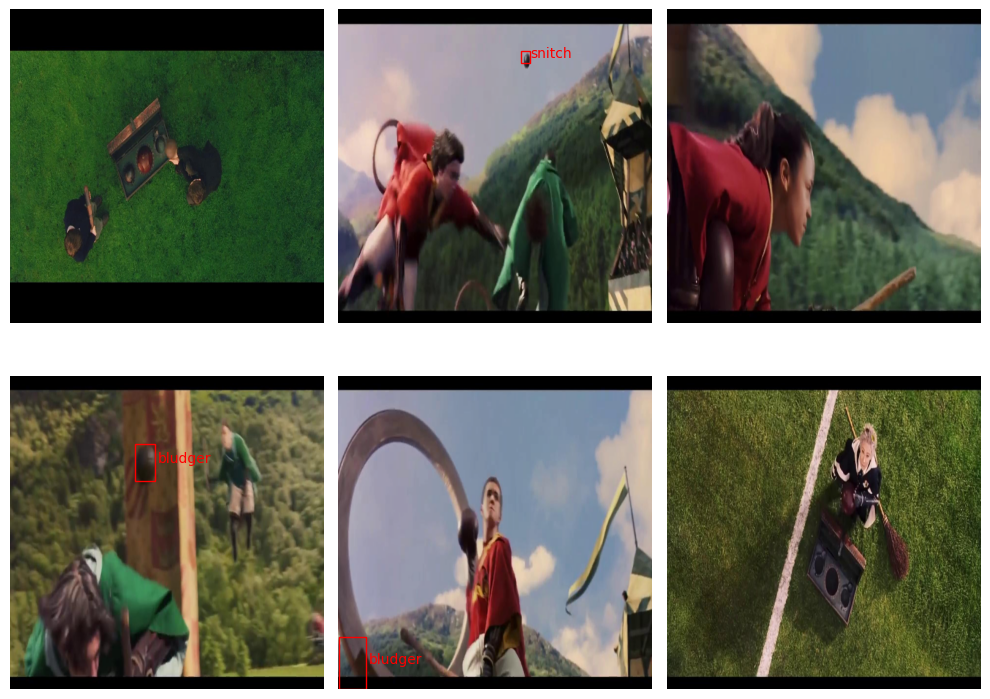

In [ ]:
# Сделайте визуализацию. Поиграйтесь с threshold, скорее всего нужно понизить до ~0.1
results = decode_prediction(outputs, upsample=32, threshold=0.01)
visualize([x for x in batch["image"]], results)

Результат сильно так себе, да? Есть множество вариантов улучшений, самый простой из которых это приделать к выходу [NMS](https://paperswithcode.com/method/non-maximum-suppression#:~:text=Non%20Maximum%20Suppression%20is%20a,below%20a%20given%20probability%20bound.). Если хочется, можно почитать про YOLO v1 [тут](https://arxiv.org/abs/1506.02640).

# Задача 4 but better (1 балл)

## Прикручиваем NMS :^)

Напомним принцип работы алгоритма:
- Сортируем bbox в порядке убывания уверенности
- Считаем Intersection over Union (IoU) для всех bbox
- Выкидываем все, пересечение с которыми больше порога
- Идем дальше по списку, пока не дойдем до конца


Не сделал :(

In [ ]:
def NMS(bboxes, threshold):
    # TODO: make it happen
    return  # Something

In [ ]:
def decode_prediction_nms(pred, upsample=32, threshold=0.7):
    b, c, h, w = pred.shape
    img_w, img_h = w * upsample, h * upsample
    ### YOUR CODE HERE ###

    return

# Задача 5. 3.5 балла.

Займёмся более простыми вещами. Возьмем готовую архитектуру, обучим её на наших данных и посмотрим.

Для этого будем использовать YOLO 11 от ultralytics.

In [ ]:
%pip list | grep ultralytics

ultralytics                           8.3.165
ultralytics-thop                      2.0.14


## Задача 5.1. 1.5 балла.

Чтобы дальше модель обучалась одной строкой, данные нужно переложить в правильный формат. Да-да, классика перекладывания JSON. Как правильно паковать можно посмотреть [тут](https://roboflow.com/formats/yolov8-pytorch-txt).

Если коротко:
* Есть .yaml, где живут пути к папкам с картинками, количество классов и их названия
* Есть папочки train valid (их поможем вам собрать), в них две подпапки:
    - Первая images, в ней лежат картинки
    - Вторая labels, в ней лежат файлы с названиями как у картинок, но вместо расширения картинок нужен .txt, внутри формат как описан на Roboflow


In [ ]:
# Делаем папочки
!rm -rf train
!rm -rf valid
!mkdir -p train/images train/labels valid/images valid/labels

Реализуйте функцию, которая принимает аннотации в изначальном формате, а возвращает их в нужном для YOLO 11. Это должен быть массив готовых строк, которые можно сразу забрасывать в файлик, добавив \n.

Использовать сторонние инструменты нельзя, нужно переложить своими руками.

In [ ]:
def annotation2txt(bboxes, w_im, h_im):
    result = []
    for bbox in bboxes:
        cx = (bbox[0] + bbox[2]) / (2 * w_im)
        cy = (bbox[1] + bbox[3]) / (2 * h_im)
        w = (bbox[2] - bbox[0]) / w_im
        h = (bbox[3] - bbox[1]) / h_im
        line = f"{int(bbox[4])} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}"
        result.append(line)
    return result

In [ ]:
# Копируем картиночки по папочкам и создаем txt файлики

for i in range(len(train_ds)):
    result = train_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        "./train/images/" + result[0].split("/")[-1],
    )

    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./train/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

for i in range(len(test_ds)):
    result = test_ds.__get_raw_item__(i)

    shutil.copyfile(
        result[0],
        "./valid/images/" + result[0].split("/")[-1],
    )
    h_im, w_im, ch = np.array(Image.open(result[0])).shape
    with open(
        "./valid/labels/" + result[0].split("/")[-1].split(".")[0] + ".txt",
        "w",
        encoding="utf8",
    ) as f:
        f.write("\n".join(annotation2txt(result[1], w_im, h_im)))

In [ ]:
# Собираем YAML

nc = 3 # Укажите число классов. Хоть руками, хоть по-умному посчитайте (см. class_dict)
names = BALL_MAPPING # Укажите имена классов. Хоть руками, хоть по-умному посчитайте, это массив строк (см. class_dict)

line =  f"""
train: ../train/images
val: ../valid/images

names:
    0: {names[0]}
    1: {names[1]}
    2: {names[2]}

nc: {nc}
"""

with open("data.yaml", "w") as f:
    f.write(line)

## Задание 5.2. 1.5 балла.

Обучите модель YOLO 11 самого маленького размера. Библиотека максимально friendly, от вас требуется написать две строчки. Модель можно взять обученную.

Подсказка: подумайте зачем вам data.yaml и что такое yolo11n.yaml (не стесняйтесь гуглить)

Если у вас лосс NaN или Windows, то есть несколько полезных ссылок (покрывают не все существующие проблемы, но может поможет вам):

https://github.com/ultralytics/ultralytics/issues/1149

https://github.com/ultralytics/yolov5/issues/6907

https://stackoverflow.com/questions/75178762/i-got-nan-for-all-losses-while-training-yolov8-model

In [ ]:
# https://github.com/ultralytics/ultralytics

model = YOLO("yolo11n.pt")

In [ ]:
# model.to(device)

In [ ]:
train_results = model.train(
    data="data.yaml",  # Path to dataset configuration file
    epochs=100,  # Number of training epochs
    imgsz=512,  # Image size for training
    device="0",  # Device to run on (e.g., 'cpu', 0, [0,1,2,3])
)

Ultralytics 8.3.165 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained=True, profile=False

train: Scanning /content/train/labels.cache... 254 images, 0 backgrounds, 0 corrupt: 100%|██████████| 254/254 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 615.2±162.0 MB/s, size: 94.9 KB)


val: Scanning /content/valid/labels.cache... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<?, ?it/s]


Plotting labels to runs/detect/train6/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 512 train, 512 val
Using 2 dataloader workers
Logging results to runs/detect/train6
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      1.38G      1.443      4.459       1.14         23        512: 100%|██████████| 16/16 [00:05<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.55it/s]

                   all         29         34    0.00201      0.545    0.00657    0.00374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100       1.4G      1.403      3.443      1.049         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.12it/s]

                   all         29         34    0.00297      0.737     0.0387     0.0286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.41G      1.384      2.853      1.055         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.53it/s]

                   all         29         34    0.00288      0.732     0.0712     0.0337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.41G      1.397      2.614      1.081         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.92it/s]

                   all         29         34     0.0031      0.796      0.241      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.41G      1.399      2.465      1.081         34        512: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.52it/s]

                   all         29         34    0.00289      0.745      0.272      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.41G      1.332      2.167      1.055         29        512: 100%|██████████| 16/16 [00:03<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.42it/s]

                   all         29         34      0.616      0.112       0.29      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.43G      1.342      2.036      1.055         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


                   all         29         34      0.491      0.117      0.407      0.258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.43G      1.377      2.074      1.038         27        512: 100%|██████████| 16/16 [00:03<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.34it/s]


                   all         29         34      0.523      0.383      0.524      0.292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.43G      1.296      1.828      1.049         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.15it/s]

                   all         29         34      0.785      0.572      0.627      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.43G      1.234      1.685      1.062         23        512: 100%|██████████| 16/16 [00:03<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]


                   all         29         34      0.622       0.55      0.606      0.375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.43G      1.252      1.633      1.036         23        512: 100%|██████████| 16/16 [00:03<00:00,  4.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.49it/s]

                   all         29         34      0.798      0.664      0.793      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.43G      1.215      1.538      1.003         24        512: 100%|██████████| 16/16 [00:03<00:00,  5.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.77it/s]

                   all         29         34      0.716      0.605      0.673      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.44G      1.248      1.543      1.032         26        512: 100%|██████████| 16/16 [00:04<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.43it/s]


                   all         29         34      0.716      0.697      0.676      0.398

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.46G      1.193      1.431      1.006         22        512: 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]

                   all         29         34      0.596      0.588      0.508      0.335



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.46G      1.225      1.492       1.02         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.67it/s]

                   all         29         34      0.874      0.562      0.681       0.43



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.47G      1.163      1.374      1.027         28        512: 100%|██████████| 16/16 [00:04<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.07it/s]


                   all         29         34      0.695       0.74      0.732      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.49G      1.178      1.322      0.977         29        512: 100%|██████████| 16/16 [00:03<00:00,  4.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.00it/s]

                   all         29         34       0.92      0.682       0.77      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.49G      1.099      1.216     0.9738         27        512: 100%|██████████| 16/16 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.66it/s]

                   all         29         34      0.886       0.72        0.8      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100       1.5G       1.11      1.215      1.005         29        512: 100%|██████████| 16/16 [00:04<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.81it/s]

                   all         29         34      0.716      0.667      0.772       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100       1.5G      1.139      1.178       1.01         26        512: 100%|██████████| 16/16 [00:03<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.78it/s]

                   all         29         34      0.898      0.661      0.806      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100       1.5G      1.078      1.107      0.974         25        512: 100%|██████████| 16/16 [00:03<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


                   all         29         34      0.732      0.729      0.766      0.535

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100       1.5G       1.07      1.073     0.9879         21        512: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.08it/s]

                   all         29         34      0.965      0.634      0.766      0.488



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100       1.5G       1.12       1.15     0.9867         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]


                   all         29         34      0.823      0.736      0.763      0.511

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100       1.5G      1.062      1.031     0.9659         35        512: 100%|██████████| 16/16 [00:03<00:00,  5.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.57it/s]

                   all         29         34      0.727      0.799      0.815      0.514



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100       1.5G      1.089      1.051     0.9804         17        512: 100%|██████████| 16/16 [00:04<00:00,  3.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.36it/s]

                   all         29         34      0.771      0.776       0.82      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100       1.5G      1.003     0.9951     0.9604         33        512: 100%|██████████| 16/16 [00:03<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.67it/s]

                   all         29         34      0.864      0.779      0.851      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100       1.5G      1.066     0.9684     0.9683         39        512: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.86it/s]

                   all         29         34      0.992      0.622      0.775      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100       1.5G      1.057      1.062     0.9763         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.41it/s]

                   all         29         34      0.941      0.697      0.783      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100       1.5G      1.053     0.9508     0.9505         38        512: 100%|██████████| 16/16 [00:03<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.17it/s]


                   all         29         34      0.903      0.797      0.829      0.566

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100       1.5G      1.015     0.9205     0.9372         31        512: 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.48it/s]

                   all         29         34      0.887      0.778       0.86       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100       1.5G      1.055     0.9302     0.9997         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.93it/s]

                   all         29         34      0.838       0.78        0.8      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100       1.5G      1.044     0.9376     0.9738         21        512: 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]


                   all         29         34       0.86      0.588      0.725      0.514

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100       1.5G      1.031     0.9006     0.9455         20        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.46it/s]

                   all         29         34      0.867      0.623      0.754      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100       1.5G      1.027     0.8717     0.9422         29        512: 100%|██████████| 16/16 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.38it/s]

                   all         29         34      0.764      0.671      0.747      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100       1.5G      1.024      0.865     0.9342         30        512: 100%|██████████| 16/16 [00:04<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.70it/s]

                   all         29         34      0.709      0.788      0.769      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100       1.5G     0.9952     0.8112     0.9289         35        512: 100%|██████████| 16/16 [00:03<00:00,  4.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.55it/s]

                   all         29         34      0.822      0.717      0.825      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100       1.5G      1.009     0.8504     0.9798         35        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]

                   all         29         34      0.842      0.774      0.837      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100       1.5G     0.9697     0.7949     0.9447         36        512: 100%|██████████| 16/16 [00:04<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.76it/s]


                   all         29         34      0.996      0.724       0.85      0.593

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100       1.5G      1.022     0.8415     0.9581         26        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.69it/s]

                   all         29         34        0.8      0.803       0.83      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100       1.5G     0.9779     0.8138     0.9386         29        512: 100%|██████████| 16/16 [00:03<00:00,  4.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.50it/s]

                   all         29         34      0.943      0.654      0.822      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100       1.5G     0.9476     0.7651     0.9384         26        512: 100%|██████████| 16/16 [00:04<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.62it/s]

                   all         29         34      0.987      0.682      0.812      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100       1.5G     0.9737      0.775     0.9393         31        512: 100%|██████████| 16/16 [00:03<00:00,  5.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.59it/s]

                   all         29         34      0.962      0.686       0.81      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100       1.5G     0.9444     0.7624     0.9173         31        512: 100%|██████████| 16/16 [00:03<00:00,  5.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.08it/s]

                   all         29         34      0.897      0.806      0.878      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100       1.5G     0.9327     0.7252     0.9153         33        512: 100%|██████████| 16/16 [00:04<00:00,  3.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.80it/s]

                   all         29         34       0.83      0.777      0.834      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100       1.5G     0.9327     0.7097     0.9065         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]

                   all         29         34      0.835      0.751      0.818      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100       1.5G     0.9441     0.7169     0.8956         30        512: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.76it/s]

                   all         29         34      0.872      0.791       0.84      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100       1.5G     0.8996     0.7011     0.8948         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         34      0.872      0.749      0.801      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100       1.5G     0.9238     0.6833     0.9125         35        512: 100%|██████████| 16/16 [00:03<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.16it/s]

                   all         29         34      0.838      0.743      0.814      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100       1.5G     0.8893     0.7015     0.9128         28        512: 100%|██████████| 16/16 [00:03<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.04it/s]


                   all         29         34      0.841      0.796      0.831      0.599

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100       1.5G     0.9151      0.682     0.9039         23        512: 100%|██████████| 16/16 [00:03<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         29         34       0.91      0.755      0.847      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100       1.5G     0.9123     0.7047      0.909         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.54it/s]

                   all         29         34      0.928      0.681      0.843      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100       1.5G     0.9372     0.6868     0.9263         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.58it/s]

                   all         29         34      0.813      0.746      0.819       0.55



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100       1.5G     0.8882     0.6862     0.9014         24        512: 100%|██████████| 16/16 [00:02<00:00,  5.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.27it/s]

                   all         29         34      0.932      0.734      0.843      0.564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100       1.5G     0.8587     0.6414     0.9141         30        512: 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]

                   all         29         34      0.897      0.769       0.82      0.554



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100       1.5G     0.8816     0.6782     0.9192         24        512: 100%|██████████| 16/16 [00:03<00:00,  5.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.23it/s]


                   all         29         34      0.852      0.738      0.814      0.549

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100       1.5G     0.8843     0.6426     0.9031         30        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.18it/s]


                   all         29         34      0.815      0.804      0.874      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100       1.5G     0.8473     0.6266     0.9009         31        512: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.97it/s]

                   all         29         34      0.802      0.782      0.849      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100       1.5G     0.8538     0.6208     0.8994         29        512: 100%|██████████| 16/16 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.01it/s]


                   all         29         34      0.886      0.706      0.829      0.573

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100       1.5G     0.8146     0.5985     0.8871         29        512: 100%|██████████| 16/16 [00:03<00:00,  5.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.16it/s]


                   all         29         34      0.829      0.741      0.806      0.555

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100       1.5G     0.8047     0.6224     0.8691         26        512: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.97it/s]


                   all         29         34      0.881      0.772      0.834      0.582

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100       1.5G     0.8587     0.6279     0.8927         34        512: 100%|██████████| 16/16 [00:03<00:00,  4.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.54it/s]

                   all         29         34      0.878      0.766      0.842      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100       1.5G      0.759     0.5807     0.8705         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.81it/s]

                   all         29         34      0.963      0.826      0.846      0.574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100       1.5G     0.8253     0.5933     0.8824         32        512: 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.55it/s]

                   all         29         34      0.892      0.834      0.851      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       1.5G     0.8152     0.6228     0.8963         25        512: 100%|██████████| 16/16 [00:03<00:00,  4.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.95it/s]

                   all         29         34      0.987      0.764      0.842      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100       1.5G     0.7909     0.5716     0.8736         24        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.41it/s]

                   all         29         34      0.956      0.807      0.844        0.6



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100       1.5G     0.8108     0.5757     0.8889         30        512: 100%|██████████| 16/16 [00:03<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.69it/s]

                   all         29         34      0.989      0.839      0.848      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100       1.5G     0.7768      0.567     0.8677         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.31it/s]


                   all         29         34       0.93      0.839      0.852      0.597

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100       1.5G      0.773     0.5547     0.8772         27        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.65it/s]

                   all         29         34      0.939      0.805      0.882       0.62



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100       1.5G     0.8155     0.5521     0.8802         35        512: 100%|██████████| 16/16 [00:03<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.54it/s]

                   all         29         34      0.952      0.827      0.903       0.63



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100       1.5G     0.7762     0.5399     0.8776         33        512: 100%|██████████| 16/16 [00:03<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.95it/s]

                   all         29         34      0.904      0.842      0.879      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       1.5G     0.7758     0.5553     0.8794         30        512: 100%|██████████| 16/16 [00:03<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]

                   all         29         34       0.91      0.809       0.86      0.609



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100       1.5G      0.744     0.5316     0.8694         32        512: 100%|██████████| 16/16 [00:03<00:00,  5.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.14it/s]

                   all         29         34      0.952      0.831      0.879      0.624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100       1.5G     0.7954      0.543     0.8824         35        512: 100%|██████████| 16/16 [00:04<00:00,  3.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.72it/s]

                   all         29         34      0.943      0.842      0.888      0.616



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100       1.5G     0.8028     0.5456     0.8947         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.36it/s]


                   all         29         34      0.986      0.772      0.869      0.589

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100       1.5G     0.8002     0.5603     0.8893         36        512: 100%|██████████| 16/16 [00:03<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.56it/s]

                   all         29         34      0.977      0.809      0.875      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100       1.5G     0.7343     0.5044     0.8725         33        512: 100%|██████████| 16/16 [00:04<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.53it/s]

                   all         29         34      0.981      0.747       0.89      0.603



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100       1.5G     0.7549     0.5296     0.8709         26        512: 100%|██████████| 16/16 [00:03<00:00,  5.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.88it/s]

                   all         29         34      0.895      0.843      0.889      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       1.5G     0.7538      0.542     0.8672         29        512: 100%|██████████| 16/16 [00:03<00:00,  5.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.89it/s]

                   all         29         34      0.887      0.817      0.869      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100       1.5G      0.731     0.5492     0.8625         19        512: 100%|██████████| 16/16 [00:04<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.08it/s]

                   all         29         34      0.954      0.779       0.87      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100       1.5G     0.7407     0.5154     0.8644         33        512: 100%|██████████| 16/16 [00:03<00:00,  4.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.49it/s]

                   all         29         34      0.964      0.805      0.861      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100       1.5G     0.7114     0.5096     0.8664         26        512: 100%|██████████| 16/16 [00:03<00:00,  5.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.04it/s]

                   all         29         34      0.973      0.809      0.853      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100       1.5G     0.6979     0.5087     0.8688         19        512: 100%|██████████| 16/16 [00:03<00:00,  4.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.14it/s]

                   all         29         34      0.982      0.824       0.86      0.591



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100       1.5G     0.7198     0.4924     0.8689         26        512: 100%|██████████| 16/16 [00:03<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]

                   all         29         34      0.938      0.778      0.859      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100       1.5G     0.7186     0.5036     0.8569         24        512: 100%|██████████| 16/16 [00:03<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.49it/s]

                   all         29         34      0.941      0.842      0.865      0.583



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100       1.5G     0.7047      0.499     0.8646         30        512: 100%|██████████| 16/16 [00:03<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.29it/s]

                   all         29         34      0.924      0.842      0.862      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100       1.5G      0.672     0.4758     0.8586         23        512: 100%|██████████| 16/16 [00:04<00:00,  3.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.15it/s]


                   all         29         34      0.976      0.811      0.869      0.578

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100       1.5G     0.6849     0.4801     0.8616         25        512: 100%|██████████| 16/16 [00:03<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.75it/s]

                   all         29         34      0.979       0.84       0.87      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       1.5G     0.6725     0.4806     0.8562         32        512: 100%|██████████| 16/16 [00:03<00:00,  4.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.63it/s]

                   all         29         34      0.976      0.835      0.873      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100       1.5G     0.6977     0.4865     0.8634         28        512: 100%|██████████| 16/16 [00:04<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.17it/s]

                   all         29         34      0.987      0.812      0.883      0.617



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100       1.5G     0.6717     0.4685     0.8699         23        512: 100%|██████████| 16/16 [00:03<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.22it/s]

                   all         29         34      0.993      0.787       0.88       0.62


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       1.5G     0.6918     0.5208     0.8409         13        512: 100%|██████████| 16/16 [00:04<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  3.21it/s]

                   all         29         34      0.972      0.782      0.845       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100       1.5G     0.7109      0.513     0.8535         16        512: 100%|██████████| 16/16 [00:03<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.57it/s]

                   all         29         34       0.99      0.803      0.855      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       1.5G     0.6863     0.4899     0.8491         16        512: 100%|██████████| 16/16 [00:03<00:00,  5.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  4.82it/s]

                   all         29         34      0.986      0.791      0.866      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100       1.5G     0.6553     0.4648     0.8394         15        512: 100%|██████████| 16/16 [00:03<00:00,  4.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.08it/s]

                   all         29         34      0.978       0.79      0.886      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       1.5G     0.7067     0.4824     0.8383         14        512: 100%|██████████| 16/16 [00:04<00:00,  3.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.09it/s]

                   all         29         34      0.957      0.817      0.893      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       1.5G      0.679     0.4774     0.8575         16        512: 100%|██████████| 16/16 [00:03<00:00,  5.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  6.20it/s]

                   all         29         34      0.955      0.814      0.891      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       1.5G     0.6358     0.4567     0.8347         18        512: 100%|██████████| 16/16 [00:03<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.64it/s]

                   all         29         34      0.955      0.805      0.884      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100       1.5G     0.6537     0.4635     0.8524         15        512: 100%|██████████| 16/16 [00:04<00:00,  3.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.96it/s]


                   all         29         34      0.962      0.798      0.876      0.596

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       1.5G     0.6501     0.4593      0.849         15        512: 100%|██████████| 16/16 [00:05<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  2.46it/s]

                   all         29         34      0.961      0.791      0.873      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100       1.5G     0.6475     0.4598     0.8285         14        512: 100%|██████████| 16/16 [00:06<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  1.90it/s]

                   all         29         34      0.959      0.791      0.868      0.585



100 epochs completed in 0.118 hours.
Optimizer stripped from runs/detect/train6/weights/last.pt, 5.4MB
Optimizer stripped from runs/detect/train6/weights/best.pt, 5.4MB

Validating runs/detect/train6/weights/best.pt...
Ultralytics 8.3.165 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:00<00:00,  5.41it/s]


                   all         29         34      0.953      0.827      0.904       0.63
               bludger          9         11      0.974      0.727      0.789      0.537
               quaffle         10         10      0.883       0.76      0.927      0.637
                snitch         13         13          1      0.993      0.995      0.718
Speed: 0.1ms preprocess, 1.3ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to runs/detect/train6


In [ ]:
metrics = model.val()

Ultralytics 8.3.165 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2164.7±735.0 MB/s, size: 68.5 KB)


val: Scanning /content/valid/labels.cache... 29 images, 0 backgrounds, 0 corrupt: 100%|██████████| 29/29 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]


                   all         29         34      0.995        0.8      0.912      0.637
               bludger          9         11      0.984      0.727      0.802      0.551
               quaffle         10         10          1      0.698      0.938      0.641
                snitch         13         13          1      0.974      0.995      0.718
Speed: 0.1ms preprocess, 12.2ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/train62


## Задание 5.3. 0.5 балла.

Как-нибудь отрисуйте предсказания на валидационной выборке (хотя бы части из 5-10 картинок).

Здесь можно использовать костыли с параметром save=True у predict, потом прочитать их чем-нибудь, отрисовать матплотлибом. Есть варианты и получше. Дефолтный show будет пытаться показывать через opencv imshow, он в коллабе работать не будет.

загрузим 10 картинок из папки валидация

In [ ]:
names = glob.glob("valid/images/*.jpg")[:10]
names

['valid/images/219.jpg',
 'valid/images/68.jpg',
 'valid/images/246.jpg',
 'valid/images/157.jpg',
 'valid/images/226.jpg',
 'valid/images/58.jpg',
 'valid/images/167.jpg',
 'valid/images/171.jpg',
 'valid/images/141.jpg',
 'valid/images/121.jpg']

In [ ]:
results = model(names)


0: 512x512 1 bludger, 4.3ms
1: 512x512 1 snitch, 4.3ms
2: 512x512 1 quaffle, 4.3ms
3: 512x512 1 quaffle, 4.3ms
4: 512x512 (no detections), 4.3ms
5: 512x512 1 snitch, 4.3ms
6: 512x512 1 snitch, 4.3ms
7: 512x512 1 snitch, 4.3ms
8: 512x512 1 bludger, 4.3ms
9: 512x512 1 quaffle, 4.3ms
Speed: 1.7ms preprocess, 4.3ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 512)


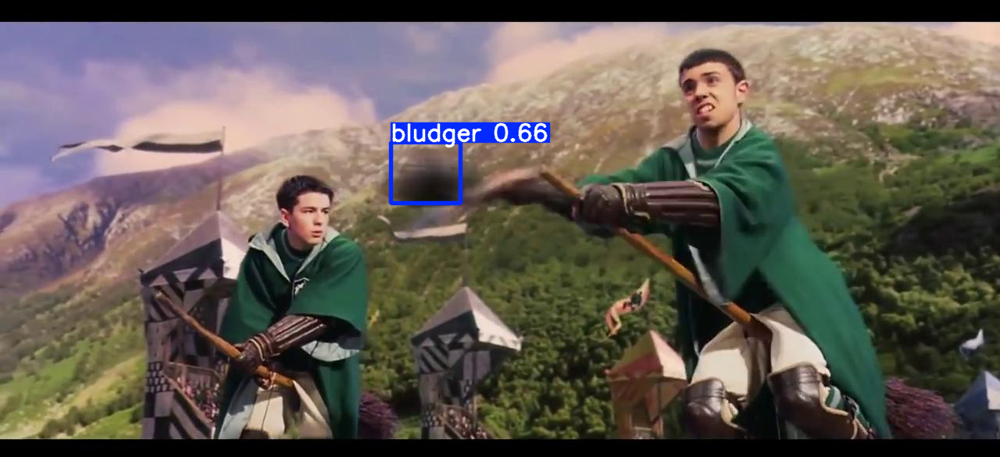

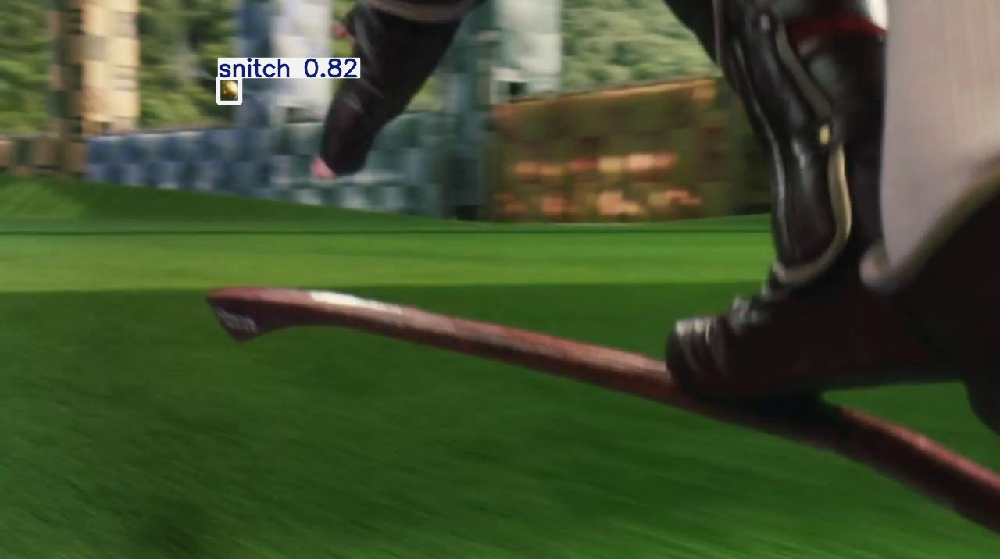

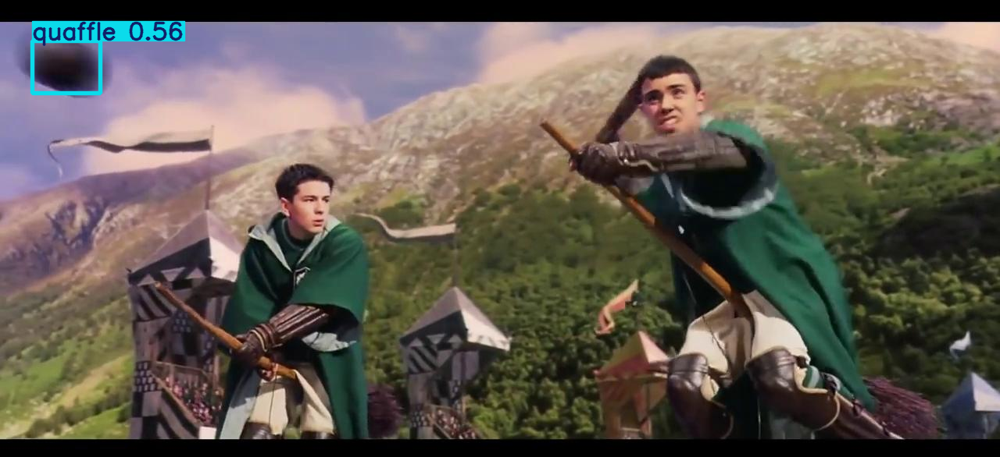

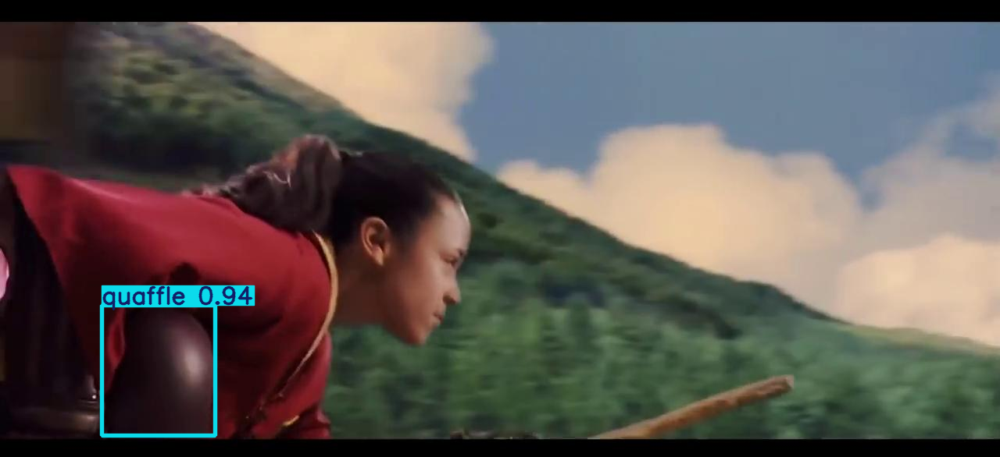

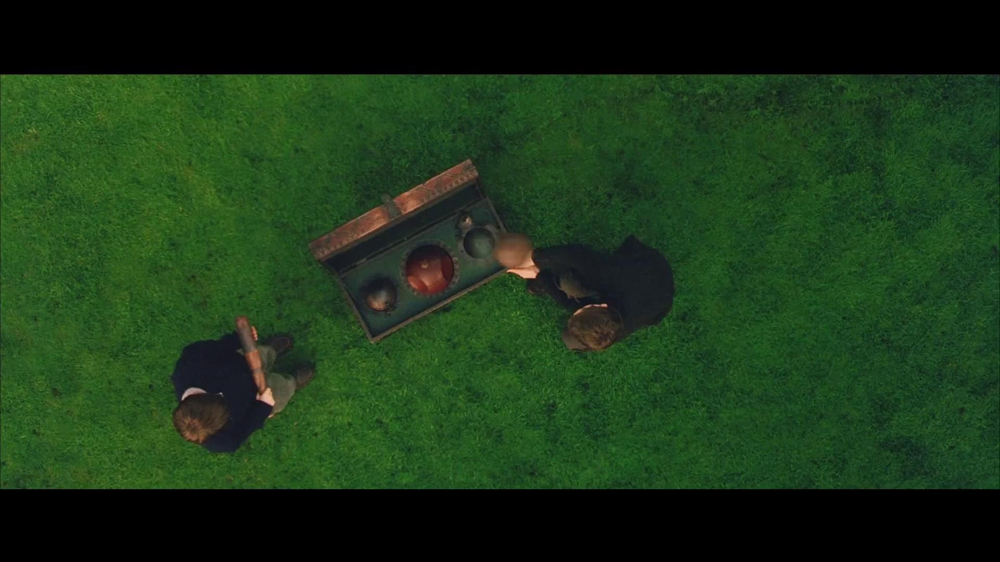

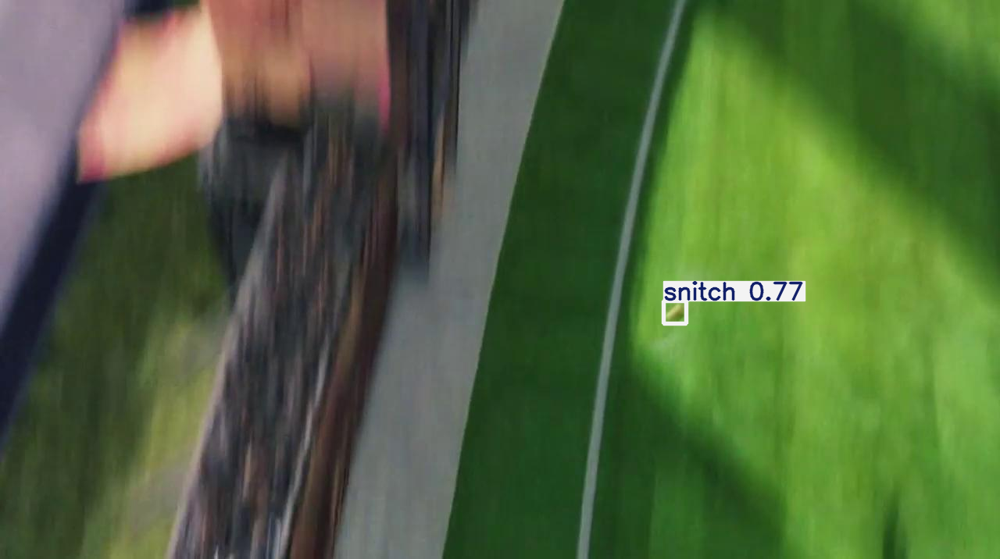

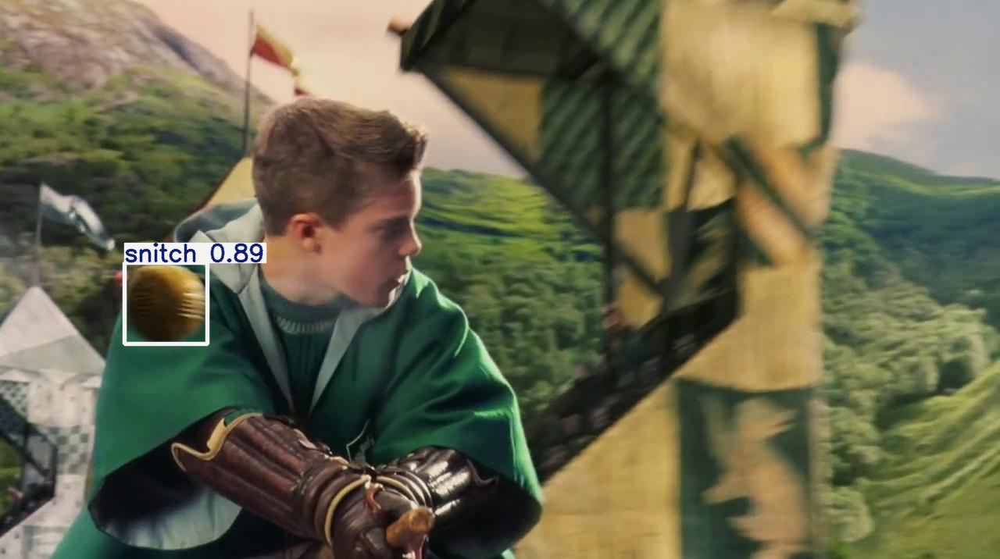

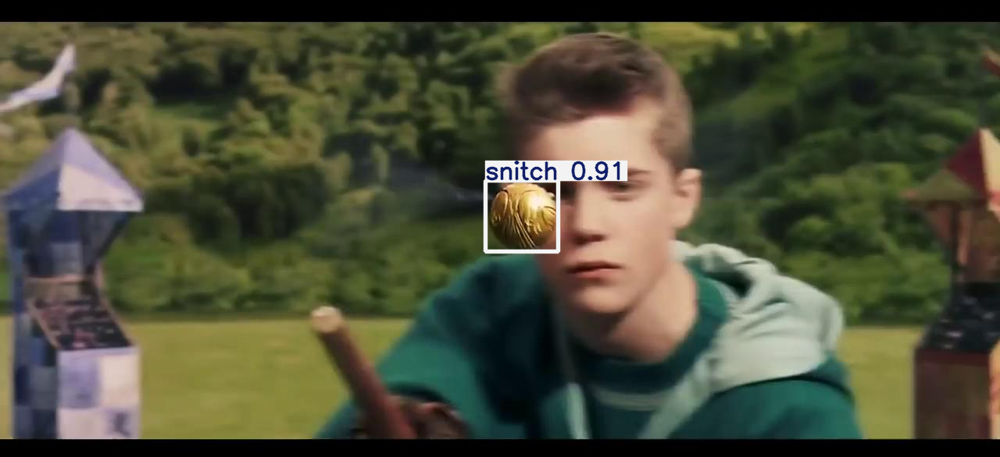

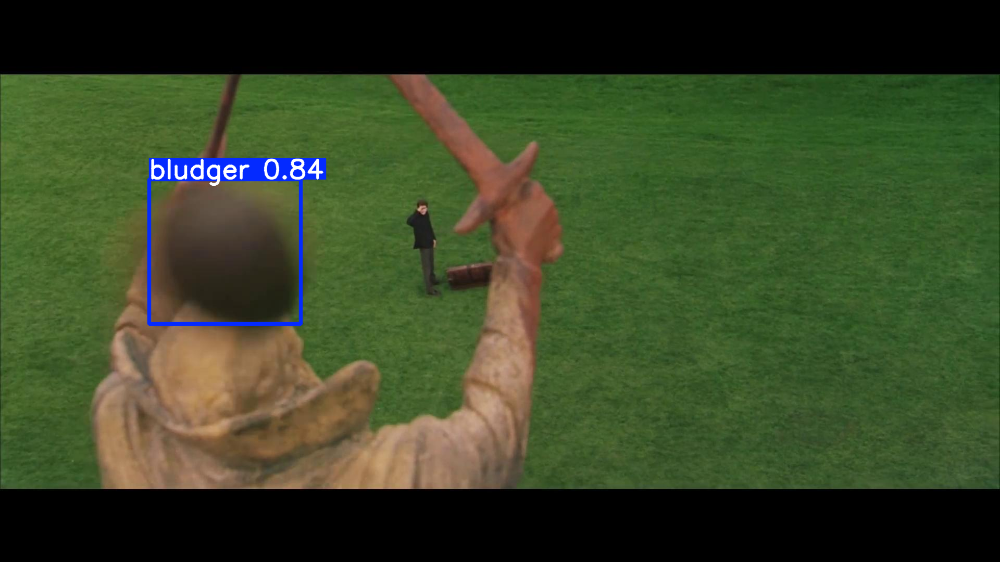

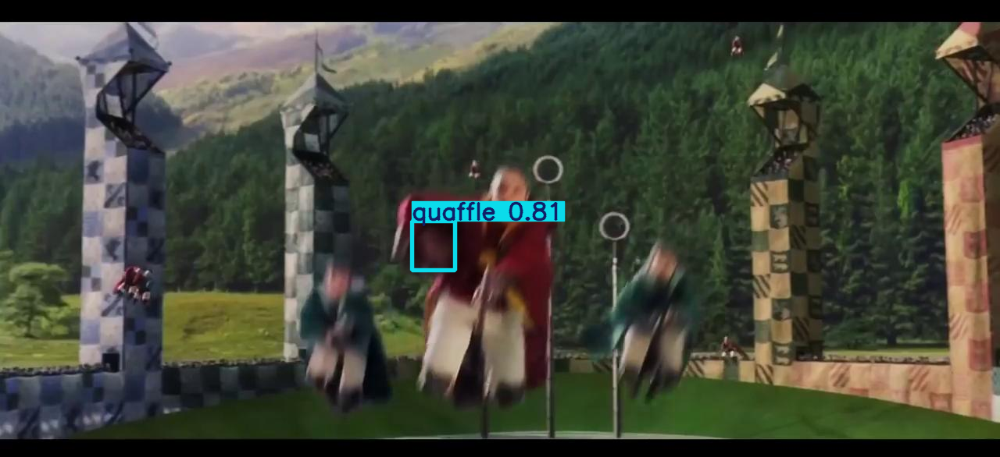

In [ ]:
# https://docs.ultralytics.com/modes/predict/#key-features-of-predict-mode

for result in results:
    boxes = result.boxes  # Boxes object for bounding box outputs
    masks = result.masks  # Masks object for segmentation masks outputs
    keypoints = result.keypoints  # Keypoints object for pose outputs
    probs = result.probs  # Probs object for classification outputs
    obb = result.obb  # Oriented boxes object for OBB outputs
    result.show()  # display to screen

## Бонус (1 балл)

Реализуйте подсчет mAP для самописной модели. Если найдете готовый код на гитхабах -- используйте с указанием ссылок :)

Сравните свою модель с YOLO11. Что получается?

Про помощь: DeepSeek использовался в двух заданиях. Это помогало, когда совсем непонятно, что делать. Однако надо просить его перепроверить код, надо проверять самому и подстраивать под свои нужды уже вручную